# Feature extraction

## Asymmetry

In [1]:
import numpy as np
import cv2
import matplotlib
import matplotlib.pyplot as plt

import segmentation as sg
import importlib

from math import atan2, sqrt, sin, cos, pi

matplotlib.rcParams['figure.figsize'] = 8,6

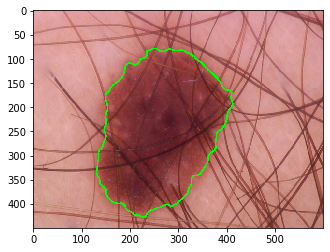

In [2]:
importlib.reload(sg)

img_a = cv2.imread('images/ISIC_0024779.jpg')
img_a = cv2.cvtColor(img_a, cv2.COLOR_BGR2RGB)

img_a_copy = np.copy(img_a)

out_contour = sg.segment(img_a_copy)

img_copy = img_a.copy()
cv2.drawContours(img_copy, [out_contour], -1, (0, 255, 0), 2)
plt.imshow(img_copy, 'gray')

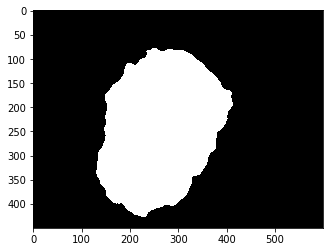

In [3]:
# Binarni prikaz detektovane konture
lesion_binary = np.zeros(img_a.shape, np.uint8)
lesion_binary = cv2.cvtColor(lesion_binary, cv2.COLOR_BGR2GRAY)
lesion_binary = cv2.drawContours(lesion_binary, [out_contour], -1, (255), thickness=-1)

plt.imshow(lesion_binary, 'gray')

0.7690192890399823
0.7690192890399823


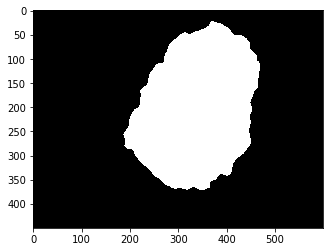

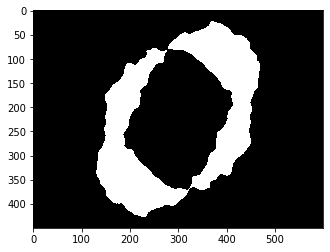

In [4]:
# Standardno rotiranje Afinom transformacijom - ne daje zeljene rezultate
center = tuple(np.array(lesion_binary.shape[1::-1])/2)
matrix = cv2.getRotationMatrix2D(center, 180, 1.0) # centar, ugao, faktor skaliranja
rotated_bin = cv2.warpAffine(lesion_binary, matrix, lesion_binary.shape[1::-1], flags = cv2.INTER_LINEAR)

plt.figure()
plt.imshow(rotated_bin, 'gray')

difference = cv2.bitwise_xor(lesion_binary, rotated_bin)
#difference = cv2.cvtColor(difference, cv2.COLOR_BGR2GRAY)

plt.figure()
plt.imshow(difference, 'gray')

deviation = (np.count_nonzero(difference)/np.count_nonzero(rotated_bin))
deviation2 = (np.count_nonzero(difference)/np.count_nonzero(lesion_binary))
print(deviation)
print(deviation2)

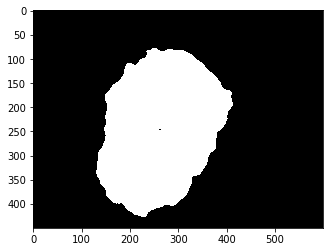

In [5]:
# Izracunavanje tezista konture na osnovu momenata
M = cv2.moments(out_contour)
if M["m00"] != 0:
    cX = int(M["m10"] / M["m00"])
    cY = int(M["m01"] / M["m00"])
else:
    cX, cY = 0, 0

lesion_binary_copy = lesion_binary.copy()
cv2.circle(lesion_binary_copy, (cX, cY), 1, (0, 0, 0), -1)
plt.imshow(lesion_binary_copy, 'gray')

In [6]:
# Metoda za iscrtavanje pronadjenih osa
def drawAxis(img, p_, q_, colour, scale):
    p = list(p_)
    q = list(q_)
    
    angle = atan2(p[1] - q[1], p[0] - q[0]) # angle in radians
    hypotenuse = sqrt((p[1] - q[1]) * (p[1] - q[1]) + (p[0] - q[0]) * (p[0] - q[0]))
    # Here we lengthen the arrow by a factor of scale
    q[0] = p[0] - scale * hypotenuse * cos(angle)
    q[1] = p[1] - scale * hypotenuse * sin(angle)
    cv2.line(img, (int(p[0]), int(p[1])), (int(q[0]), int(q[1])), colour, 1, cv2.LINE_AA)
    # create the arrow hooks
    p[0] = q[0] + 9 * cos(angle + pi / 4)
    p[1] = q[1] + 9 * sin(angle + pi / 4)
    cv2.line(img, (int(p[0]), int(p[1])), (int(q[0]), int(q[1])), colour, 1, cv2.LINE_AA)
    p[0] = q[0] + 9 * cos(angle - pi / 4)
    p[1] = q[1] + 9 * sin(angle - pi / 4)
    cv2.line(img, (int(p[0]), int(p[1])), (int(q[0]), int(q[1])), colour, 1, cv2.LINE_AA)

(261, 254)


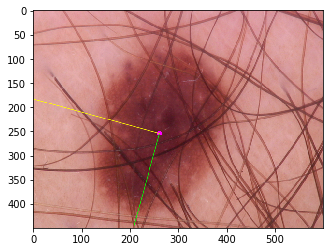

In [7]:
# Trazenje glavne i sporedne ose
img_axis = img_a.copy()
img_axis_bin = lesion_binary_copy.copy()
points = np.empty((len(out_contour),2), dtype=np.float64)
for i in range(points.shape[0]):
    points[i,0] = out_contour[i,0,0]
    points[i,1] = out_contour[i,0,1]

plt.imshow(points)

mean = np.empty((0))
mean, eigenvectors, eigenvalues = cv2.PCACompute2(points, mean)

pca_center = (int(mean[0,0]), int(mean[0,1]))
       
cv2.circle(img_axis, pca_center, 3, (255, 0, 255), 2)
print(pca_center)
p1 = (pca_center[0] + 0.02 * eigenvectors[0,0] * eigenvalues[0,0], pca_center[1] + 0.02 * eigenvectors[0,1] * eigenvalues[0,0])
p2 = (pca_center[0] - 0.02 * eigenvectors[1,0] * eigenvalues[1,0], pca_center[1] - 0.02 * eigenvectors[1,1] * eigenvalues[1,0])
drawAxis(img_axis, pca_center, p1, (0, 255, 0), 1)
drawAxis(img_axis, pca_center, p2, (255, 255, 0), 5)

angle = atan2(eigenvectors[0,1], eigenvectors[0,0])
angle_degrees = angle*180/pi

plt.imshow(img_axis)

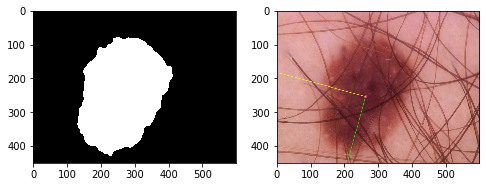

In [14]:
matplotlib.rcParams['figure.figsize'] = 8,6

f = plt.figure()
f.add_subplot(1,2,1)
plt.imshow(lesion_binary, 'gray')

f.add_subplot(1,2,2)
plt.imshow(img_axis)

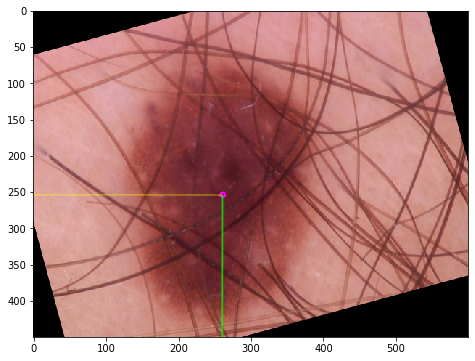

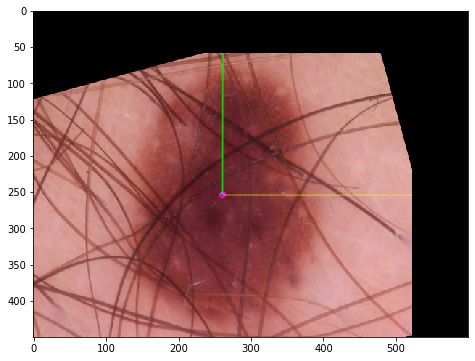

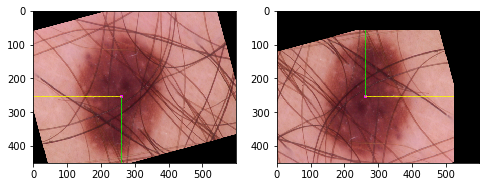

In [15]:
# Rotiranje oko glavne ose

prot1 = img_axis.copy()

# Centar konture oko koga se vrsi rotiranje
center = pca_center

matrix = cv2.getRotationMatrix2D(center, angle_degrees - 90, 1.0) # centar, ugao, faktor skaliranja

# Korekcija u odnosu na glavnu osu
corrected = cv2.warpAffine(prot1, matrix, prot1.shape[1::-1], flags = cv2.INTER_LINEAR)

plt.figure()
plt.imshow(corrected)

matrix = cv2.getRotationMatrix2D(center, 180, 1.0)

rot_major = cv2.warpAffine(corrected, matrix, corrected.shape[1::-1], flags = cv2.INTER_LINEAR)

plt.figure()
plt.imshow(rot_major)

f = plt.figure()
f.add_subplot(1,2,1)
plt.imshow(corrected)

f.add_subplot(1,2,2)
plt.imshow(rot_major)

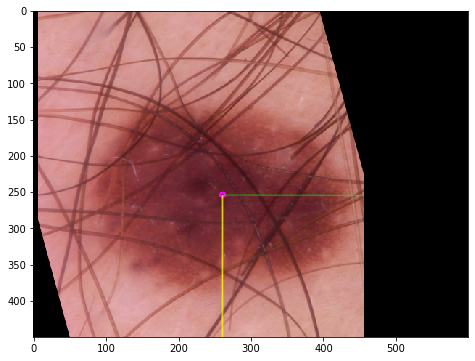

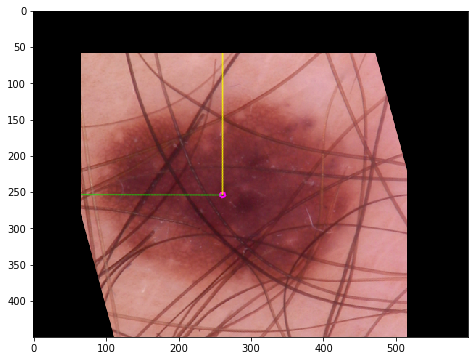

In [16]:
# Rotiranje oko sporedne ose

matrix = cv2.getRotationMatrix2D(center, 90, 1.0)

# Korekcija u odnosu na sporednu osu
interstage = cv2.warpAffine(corrected, matrix, corrected.shape[1::-1], flags = cv2.INTER_LINEAR)

plt.figure()
plt.imshow(interstage)

matrix = cv2.getRotationMatrix2D(center, 180, 1.0)

rot_minor = cv2.warpAffine(interstage, matrix, interstage.shape[1::-1], flags = cv2.INTER_LINEAR)

plt.figure()
plt.imshow(rot_minor)


0.9189533487568454


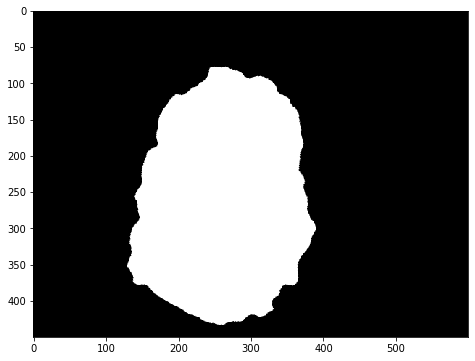

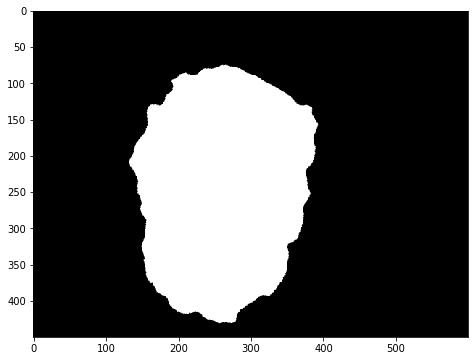

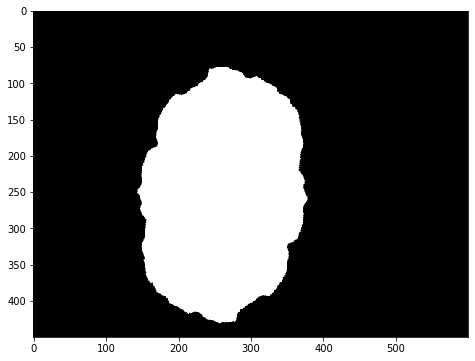

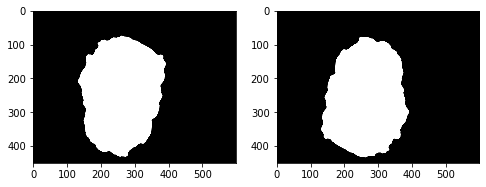

In [19]:
# Poklapanja pri rotiranju po glavnoj osi
lb1 = lesion_binary.copy()

matrix = cv2.getRotationMatrix2D(pca_center, angle_degrees - 90, 1.0)

# Korekcija i pravljenje duplikata
lb1 = cv2.warpAffine(lb1, matrix, lb1.shape[1::-1], flags = cv2.INTER_LINEAR)
lb2 = lb1.copy()

# Rotacija oko glavne ose
matrix = cv2.getRotationMatrix2D(pca_center, 180, 1.0)

lb1 = cv2.warpAffine(lb1, matrix, lb1.shape[1::-1], flags = cv2.INTER_LINEAR)

difference = cv2.bitwise_and(lb1, lb2)

deviation = (np.count_nonzero(difference)/np.count_nonzero(lb1))
print(deviation)

plt.figure()
plt.imshow(lb1, 'gray')
plt.figure()
plt.imshow(lb2, 'gray')
plt.figure()
plt.imshow(difference, 'gray')


f = plt.figure()
f.add_subplot(1,2,1)
plt.imshow(lb2, 'gray')

f.add_subplot(1,2,2)
plt.imshow(lb1, 'gray')

0.9189533487568454


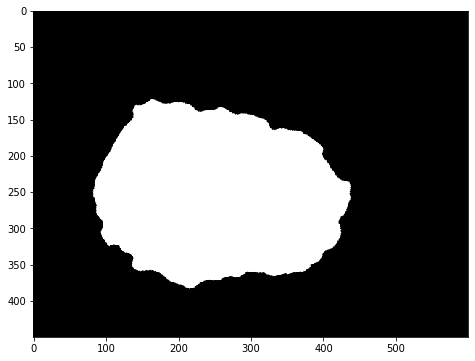

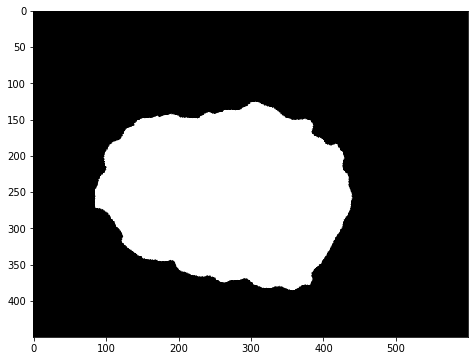

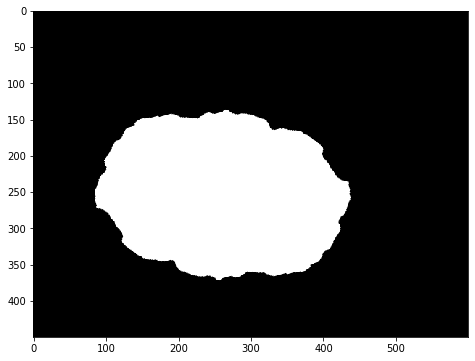

In [20]:
# Poklapanja pri rotiranju po sporednoj osi
lb3 = lb1.copy()

matrix = cv2.getRotationMatrix2D(pca_center, 90, 1.0)

# Korekcija na sporednu osu i pravljenje duplikata
lb3 = cv2.warpAffine(lb3, matrix, lb3.shape[1::-1], flags = cv2.INTER_LINEAR)
lb4 = lb3.copy()

# Rotacija oko sporedne ose
matrix = cv2.getRotationMatrix2D(pca_center, 180, 1.0)

lb3 = cv2.warpAffine(lb3, matrix, lb3.shape[1::-1], flags = cv2.INTER_LINEAR)

difference2 = cv2.bitwise_and(lb3, lb4)

deviation2 = (np.count_nonzero(difference2)/np.count_nonzero(lb3))
print(deviation2)

plt.figure()
plt.imshow(lb3, 'gray')
plt.figure()
plt.imshow(lb4, 'gray')
plt.figure()
plt.imshow(difference2, 'gray')

### Examples

In [13]:
import asymmetry as a
import importlib

Symmetry : 0.7756895072623825


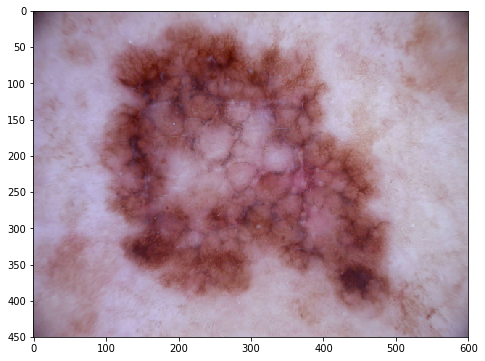

In [805]:
importlib.reload(a)

ii = cv2.imread('images/ISIC_0033834.jpg')
ii = cv2.cvtColor(ii, cv2.COLOR_BGR2RGB)
A1 = a.asymmetry(ii)

print("Symmetry :", A1)
plt.imshow(ii)

Symmetry : 0.754823185665793


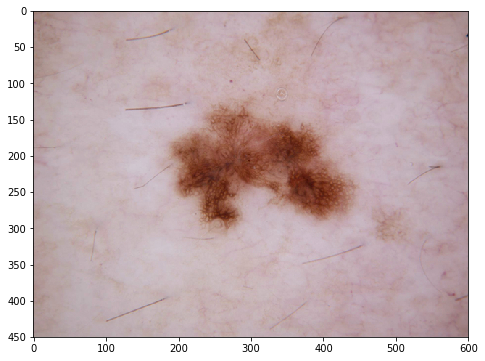

In [806]:
importlib.reload(a)

ii = cv2.imread('images/ISIC_0025106.jpg')
ii = cv2.cvtColor(ii, cv2.COLOR_BGR2RGB)
A1 = a.asymmetry(ii)

print("Symmetry :", A1)
plt.imshow(ii)

Symmetry : 0.9186007545374945


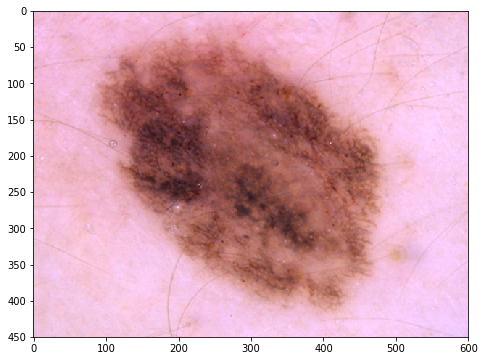

In [807]:
importlib.reload(a)

ii = cv2.imread('images/ISIC_0025785.jpg')
ii = cv2.cvtColor(ii, cv2.COLOR_BGR2RGB)
A1 = a.asymmetry(ii)

print("Symmetry :", A1)
plt.imshow(ii)

Symmetry : 0.5253977503040129


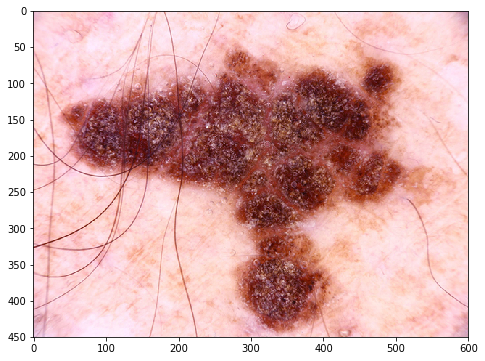

In [808]:
importlib.reload(a)

ii = cv2.imread('images/ISIC_0025885.jpg')
ii = cv2.cvtColor(ii, cv2.COLOR_BGR2RGB)
A1 = a.asymmetry(ii)

print("Symmetry :", A1)
plt.imshow(ii)

Symmetry : 0.9341208803898473


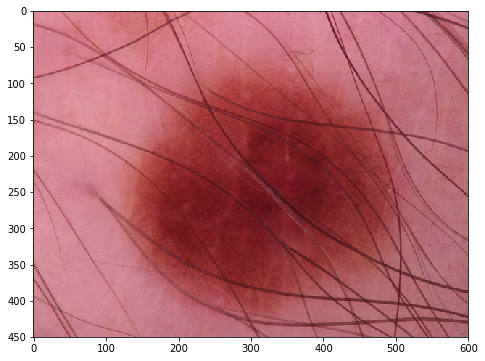

In [809]:
importlib.reload(a)

ii = cv2.imread('images/ISIC_0026285.jpg')
ii = cv2.cvtColor(ii, cv2.COLOR_BGR2RGB)
A1 = a.asymmetry(ii)

print("Symmetry :", A1)
plt.imshow(ii)

## Border

In [22]:
import numpy as np
import cv2
import matplotlib
import matplotlib.pyplot as plt

import segmentation as sg
import importlib

matplotlib.rcParams['figure.figsize'] = 8,6

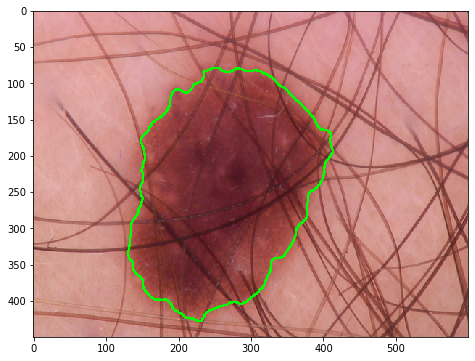

In [23]:
importlib.reload(sg)

img = cv2.imread('images/ISIC_0024779.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

out_contour = sg.segment(img)

img_copy = img.copy()
cv2.drawContours(img_copy, [out_contour], -1, (0, 255, 0), 2)
plt.imshow(img_copy)

Border regularity:  0.9553024971744184


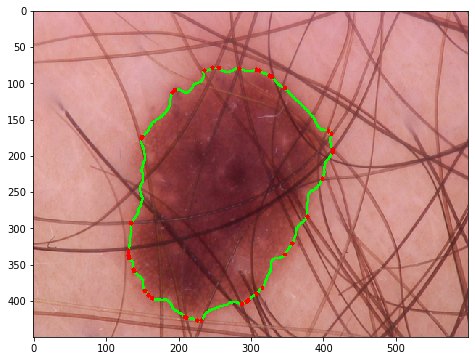

In [24]:
img_copy2 = img_copy.copy()

# Convex hull
hull = cv2.convexHull(out_contour, returnPoints=True)
cv2.drawContours(img_copy2, hull, -1, (255, 0, 0), 5)
plt.imshow(img_copy2)

countour_area = cv2.contourArea(out_contour);
hull_area = cv2.contourArea(hull)

B1 = countour_area / hull_area
print("Border regularity: ", B1)

0.9553024971744184


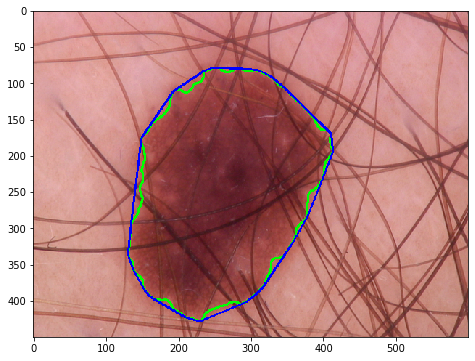

In [25]:
img_copy3 = img_copy.copy()

# Convex hull
hull = cv2.convexHull(out_contour, returnPoints=True)
cv2.drawContours(img_copy3, [hull], -1, (0, 0, 255), 2)
plt.imshow(img_copy3)

countour_area = cv2.contourArea(out_contour);
hull_area = cv2.contourArea(hull)

B1 = countour_area / hull_area
print(B1)

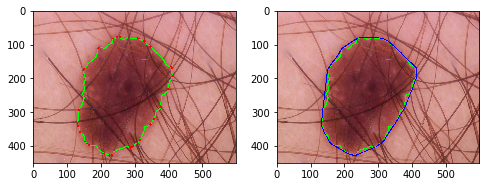

In [26]:
f = plt.figure()
f.add_subplot(1,2, 1)
plt.imshow(img_copy2)

f.add_subplot(1,2, 2)
plt.imshow(img_copy3)

### Examples

In [814]:
import border as b
import importlib

0.8823132094747196


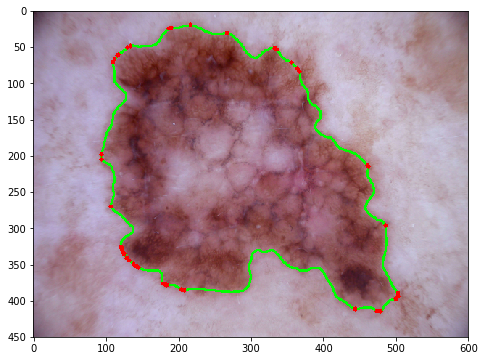

In [815]:
importlib.reload(b)
ii = cv2.imread('images/ISIC_0033834.jpg')
ii = cv2.cvtColor(ii, cv2.COLOR_BGR2RGB)
output_border, B1 = b.border_feature(ii)

print(B1)
plt.imshow(output_border)

0.9024466778436242


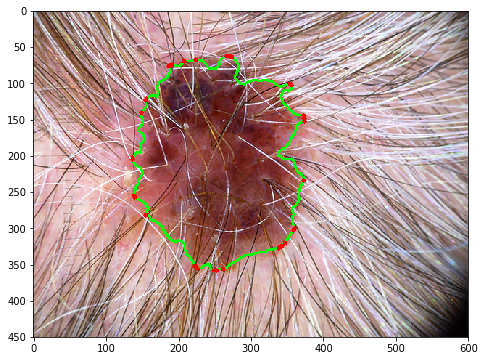

In [816]:
importlib.reload(b)
ii = cv2.imread('images/ISIC_0032214.jpg')
ii = cv2.cvtColor(ii, cv2.COLOR_BGR2RGB)
output_border, B1 = b.border_feature(ii)

print(B1)
plt.imshow(output_border)

0.8499507602142531


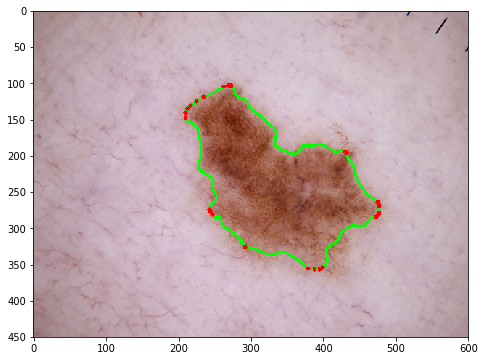

In [817]:
importlib.reload(b)
ii = cv2.imread('images/ISIC_0031550.jpg')
ii = cv2.cvtColor(ii, cv2.COLOR_BGR2RGB)
output_border, B1 = b.border_feature(ii)

print(B1)
plt.imshow(output_border)

0.8093471810089021


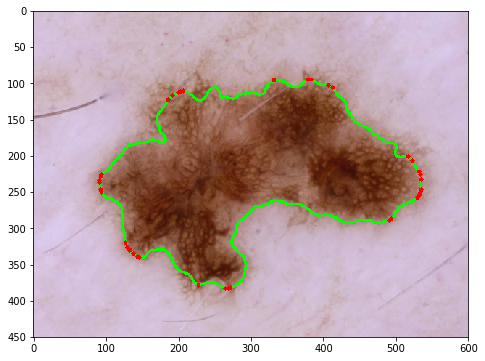

In [818]:
importlib.reload(b)
ii = cv2.imread('images/ISIC_0027066.jpg')
ii = cv2.cvtColor(ii, cv2.COLOR_BGR2RGB)
output_border, B1 = b.border_feature(ii)

print(B1)
plt.imshow(output_border)

0.9693426924507251


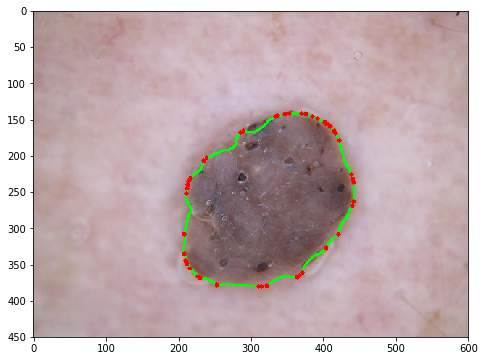

In [819]:
importlib.reload(b)
ii = cv2.imread('images/ISIC_0026644.jpg')
ii = cv2.cvtColor(ii, cv2.COLOR_BGR2RGB)
output_border, B1 = b.border_feature(ii)

print(B1)
plt.imshow(output_border)

0.9585680940115905


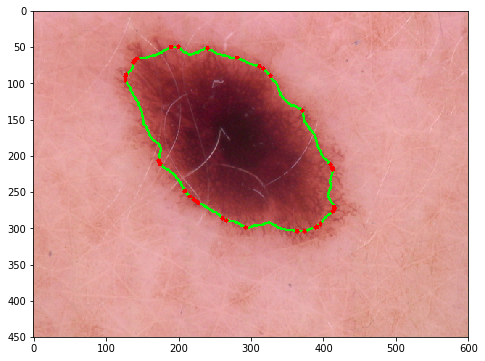

In [820]:
importlib.reload(b)
ii = cv2.imread('images/ISIC_0026639.jpg')
ii = cv2.cvtColor(ii, cv2.COLOR_BGR2RGB)
output_border, B1 = b.border_feature(ii)

print(B1)
plt.imshow(output_border)

0.8542068079640334


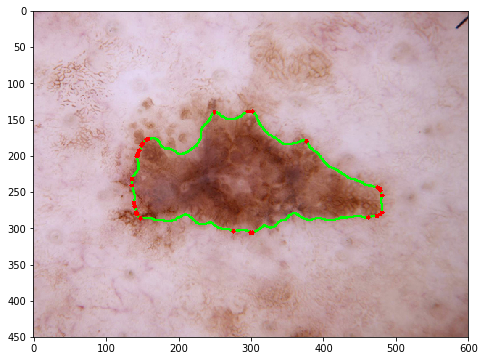

In [821]:
importlib.reload(b)
ii = cv2.imread('images/ISIC_0028899.jpg')
ii = cv2.cvtColor(ii, cv2.COLOR_BGR2RGB)
output_border, B1 = b.border_feature(ii)

print(B1)
plt.imshow(output_border)

0.9617205297085957


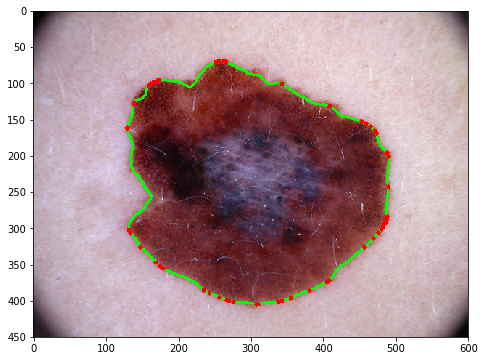

In [822]:
importlib.reload(b)
ii = cv2.imread('images/ISIC_0032637.jpg')
ii = cv2.cvtColor(ii, cv2.COLOR_BGR2RGB)
output_border, B1 = b.border_feature(ii)

print(B1)
plt.imshow(output_border)

0.9288969917958068


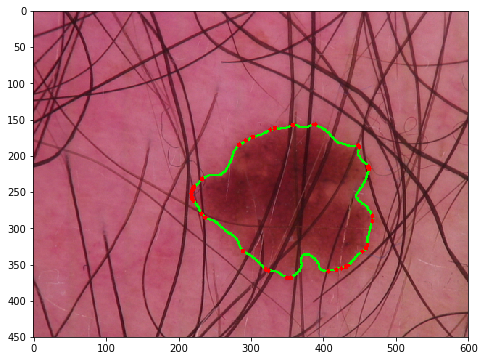

In [823]:
importlib.reload(b)
ii = cv2.imread('images/ISIC_0029131.jpg')
ii = cv2.cvtColor(ii, cv2.COLOR_BGR2RGB)
output_border, B1 = b.border_feature(ii)

print(B1)
plt.imshow(output_border)

## Color

In [27]:
import numpy as np
import cv2
import matplotlib
import matplotlib.pyplot as plt

import segmentation as sg
import importlib

matplotlib.rcParams['figure.figsize'] = 8,6

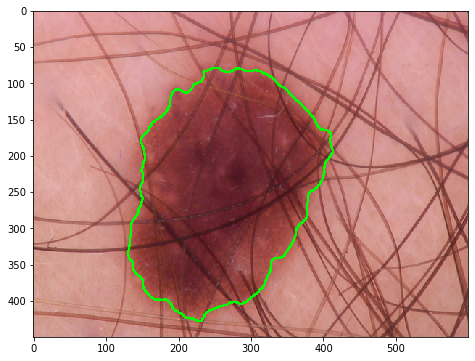

In [29]:
importlib.reload(sg)

img_c = cv2.imread('images/ISIC_0024779.jpg')

img_yuv = cv2.cvtColor(img_c, cv2.COLOR_BGR2YUV)

# equalize the histogram of the Y channel
#img_yuv[:,:,0] = cv2.equalizeHist(img_yuv[:,:,0])

# convert the YUV image back to RGB format
#imgceq = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2BGR)

#imgceq = cv2.cvtColor(imgceq, cv2.COLOR_BGR2RGB)
#img_c = cv2.cvtColor(img_c, cv2.COLOR_BGR2RGB)

#plt.figure()
#plt.imshow(ini)
#plt.figure()
#plt.imshow(imgceq)

#img_c = imgceq.copy()

img_copy_c = img_c.copy()
img_copy_c = cv2.cvtColor(img_c, cv2.COLOR_BGR2RGB)

out_contour_c = sg.segment(img_copy_c)

cv2.drawContours(img_copy_c, [out_contour_c], -1, (0, 255, 0), 2)
plt.imshow(img_copy_c)

#img_c = imgceq.copy()

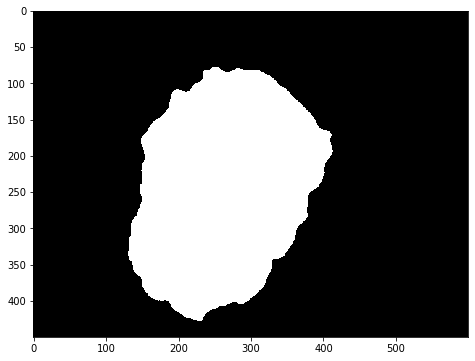

In [30]:
# Pokusaj preko HSV modela boja
color_mask = np.zeros(img_c.shape, np.uint8)
color_mask = cv2.cvtColor(color_mask, cv2.COLOR_BGR2GRAY)
color_mask = cv2.drawContours(color_mask, [out_contour_c], -1, (255), thickness=-1)

# Primeceno da svetlija boja pri ivicama utice na devijaciju boja
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (25,25))
color_mask_2 = cv2.erode(np.copy(color_mask), kernel, iterations = 1)

plt.imshow(color_mask, 'gray')

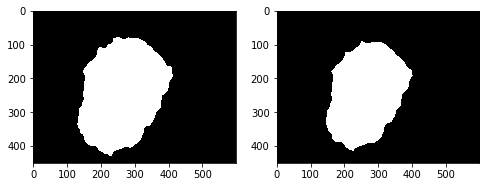

In [32]:
f = plt.figure()
f.add_subplot(1,2, 1)
plt.imshow(color_mask, 'gray')

f.add_subplot(1,2, 2)
plt.imshow(color_mask_2, 'gray')

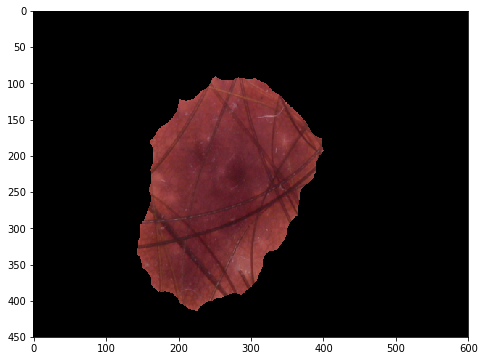

In [835]:
imgHSV = cv2.cvtColor(img_c, cv2.COLOR_BGR2HSV)
img_gray = cv2.cvtColor(img_c, cv2.COLOR_RGB2GRAY)
mask3 = np.dstack((color_mask, color_mask, color_mask))

a = cv2.cvtColor(img_c, cv2.COLOR_BGR2RGB)
#masked = a * mask3
masked = cv2.bitwise_and(imgHSV, mask3)
a = cv2.bitwise_and(a, mask3)
plt.imshow(a)

In [836]:
contour_pixels = masked[(masked[:,:,1] != 0) & (masked[:,:,0] != 0) & (masked[:,:,2] != 0)]
contour_pixels2 = a[(a[:,:,1] != 0) & (a[:,:,0] != 0) & (a[:,:,2] != 0)]
stddev = np.std(contour_pixels, axis=0)
stddev2 = np.std(contour_pixels2, axis=0)
print('HSV =', stddev)
print('RGB =', stddev2)
print()
print(contour_pixels)
print()
# print((stddev[0] + stddev[1] + stddev[2])/3)
print("Mean :", (stddev[0] + stddev[1] + stddev[2])/3)
print("Mean RGB:", (stddev2[0] + stddev2[1] + stddev2[2])/3)
print("Mean W:", (0.21*stddev2[0] + 0.72*stddev2[1] + 0.07*stddev2[2]))
print()
#print(max(stddev))

HSV = [80.12251885 12.53585818 21.98918562]
RGB = [21.93557709 13.74866946 11.52225521]

[[  1 139 162]
 [  2 131 164]
 [  2 139 160]
 ...
 [  3 147 166]
 [  3 146 164]
 [  3 148 165]]

Mean : 38.215854218263736
Mean RGB: 15.735500588013437
Mean W: 15.312071065701945



In [837]:
#Normalization
import numpy as np
from matplotlib import pyplot as plt
 
img = cv2.imread('images/ISIC_0024779.jpg',)
#img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

#h = cv2.calcHist(img, [0], color_mask.astype('uint8'), 256, [0,256]);

equ = cv2.equalizeHist(img)
res = np.hstack((img,equ))
res = cv2.cvtColor(res, cv2.COLOR_BGR2RGB)
plt.imshow(color_mask)

error: OpenCV(4.0.0) C:\projects\opencv-python\opencv\modules\imgproc\src\histogram.cpp:3334: error: (-215:Assertion failed) _src.type() == CV_8UC1 in function 'cv::equalizeHist'


### Examples

In [779]:
import color as c
import importlib

uint8
uint8
8.932074249432578


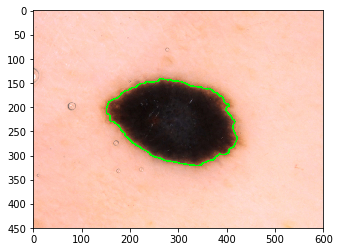

In [790]:
importlib.reload(c)
ii = cv2.imread('images/ISIC_0027398.jpg')
ii = cv2.cvtColor(ii, cv2.COLOR_BGR2RGB)
deviation = c.color_feature(ii)

out_contour_c = sg.segment(ii)

cv2.drawContours(ii, [out_contour_c], -1, (0, 255, 0), 2)

print(deviation)
plt.imshow(ii)

uint8
uint8
30.916068361512945


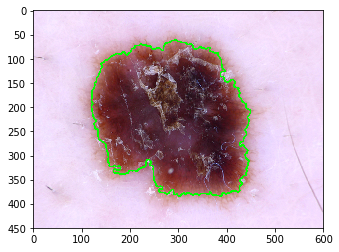

In [796]:
importlib.reload(c)
ii = cv2.imread('images/ISIC_0027640.jpg')
ii = cv2.cvtColor(ii, cv2.COLOR_BGR2RGB)
deviation = c.color_feature(ii)

out_contour_c = sg.segment(ii)

cv2.drawContours(ii, [out_contour_c], -1, (0, 255, 0), 2)

print(deviation)
plt.imshow(ii)

uint8
uint8
19.848885324329878


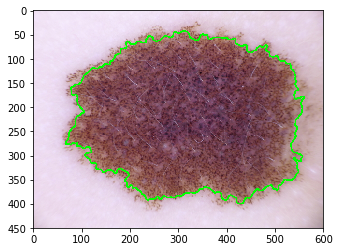

In [788]:
importlib.reload(c)
ii = cv2.imread('images/ISIC_0027961.jpg')
ii = cv2.cvtColor(ii, cv2.COLOR_BGR2RGB)
deviation = c.color_feature(ii)

out_contour_c = sg.segment(ii)

cv2.drawContours(ii, [out_contour_c], -1, (0, 255, 0), 2)

print(deviation)
plt.imshow(ii)

uint8
uint8
45.063247682547065


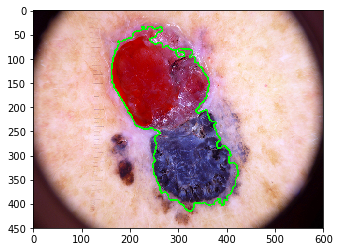

In [802]:
importlib.reload(c)
ii = cv2.imread('images/ISIC_0025234.jpg')
ii = cv2.cvtColor(ii, cv2.COLOR_BGR2RGB)
deviation = c.color_feature(ii)

out_contour_c = sg.segment(ii)

cv2.drawContours(ii, [out_contour_c], -1, (0, 255, 0), 2)

print(deviation)
plt.imshow(ii)

uint8
uint8
18.785438193053448


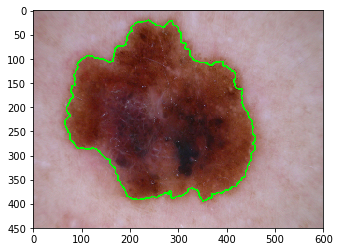

In [792]:
importlib.reload(c)
ii = cv2.imread('images/ISIC_0032547.jpg')
ii = cv2.cvtColor(ii, cv2.COLOR_BGR2RGB)
deviation = c.color_feature(ii)

out_contour_c = sg.segment(ii)

cv2.drawContours(ii, [out_contour_c], -1, (0, 255, 0), 2)

print(deviation)
plt.imshow(ii)

uint8
uint8
9.652009645184918


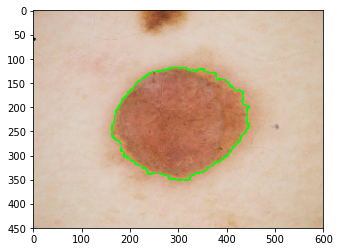

In [793]:
importlib.reload(c)
ii = cv2.imread('images/ISIC_0028183.jpg')
ii = cv2.cvtColor(ii, cv2.COLOR_BGR2RGB)
deviation = c.color_feature(ii)

out_contour_c = sg.segment(ii)

cv2.drawContours(ii, [out_contour_c], -1, (0, 255, 0), 2)

print(deviation)
plt.imshow(ii)

uint8
uint8
39.74274599397511


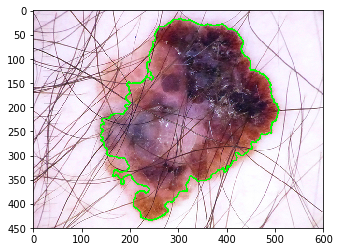

In [794]:
importlib.reload(c)
ii = cv2.imread('images/ISIC_0028086.jpg')
ii = cv2.cvtColor(ii, cv2.COLOR_BGR2RGB)
deviation = c.color_feature(ii)

out_contour_c = sg.segment(ii)

cv2.drawContours(ii, [out_contour_c], -1, (0, 255, 0), 2)

print(deviation)
plt.imshow(ii)

uint8
uint8
26.125753178136296


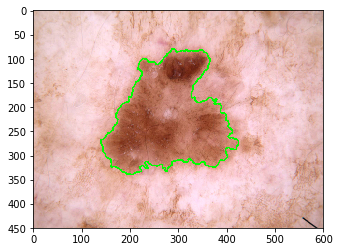

In [795]:
importlib.reload(c)
ii = cv2.imread('images/ISIC_0027550.jpg')
ii = cv2.cvtColor(ii, cv2.COLOR_BGR2RGB)
deviation = c.color_feature(ii)

out_contour_c = sg.segment(ii)

cv2.drawContours(ii, [out_contour_c], -1, (0, 255, 0), 2)

print(deviation)
plt.imshow(ii)

uint8
uint8
24.34668799551862


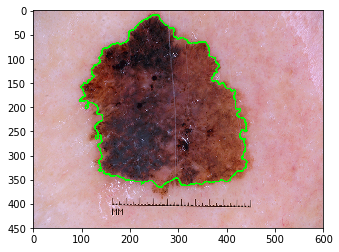

In [803]:
importlib.reload(c)
ii = cv2.imread('images/ISIC_0026745.jpg')
ii = cv2.cvtColor(ii, cv2.COLOR_BGR2RGB)
deviation = c.color_feature(ii)

out_contour_c = sg.segment(ii)

cv2.drawContours(ii, [out_contour_c], -1, (0, 255, 0), 2)

print(deviation)
plt.imshow(ii)

# Test

In [825]:
import asymmetry as a_module
import border as b_module
import color as c_module
import preprocessing as p_module
import segmentation as s_module
import importlib

In [842]:
importlib.reload(a_module)
importlib.reload(b_module)
importlib.reload(c_module)
importlib.reload(p_module)
importlib.reload(s_module)

img = cv2.imread('images/ISIC_0026745.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

pp_image = p_module.preprocess(img)
contour = s_module.segment_pipe(pp_image)

A = a_module.asymmetry_pipe(img, contour)
B = b_module.border_pipe(contour)
C = c_module.color_pipe(img, contour)
       
print("A =", A)
print("B =", B)
print("C =", C)

A = 0.8928702400246058
B = 0.9225998126520816
C = 24.306231501471114
